How to predict the weather using Facebook's prophet algorithm.        
The great thing about profit is you don't need to do any feature engineering it automatically picks up trends and seasonality in the data. It can also predict multiple days or even years into the future. 

- First, load and clean weather data
- make initial predictions using the prophet library
- cross-validate those predictions across whole data set
- end with how to make future predictions for the next year and beyond

In [2]:
# %pip install pandas prophet scikit-learn plotly

In [3]:
import pandas as pd
import numpy as np

## Load and Clean the data

Download data from
https://www.ncei.noaa.gov/cdo-web/search?datasetid=GHCND      
index column to be the DATE column

In [4]:
weather = pd.read_csv("weather2.csv", index_col="DATE")

In [5]:
weather.head()

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV01,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",90.0,100.0,NaN,NaN,NaN,0.05,0.4,0.0,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
weather.tail()

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y,ds
DATE,,,,,,,,,,,,,,,,
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0,2022-11-13
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0,2022-11-14
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0,2022-11-15
2022-11-16,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.20,0.0,0.0,53,41,USW00014732,"LAGUARDIA AIRPORT, NY US",0.20,0.0,0.0,51,39,47.0,2022-11-16
2022-11-17,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,38,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,47,39,47.0,2022-11-17


Weather data is from 1970 to Nov 17th 2022   
The data is from two locations in New york. One is JFK INTERNATIONAL AIRPORT and LAGUARDIA AIRPORT    
So for each day there are two rows      
     
PRCP is how much it rained      
SNOW is how much it snowed     
SNWD snow depth, how snow on the ground      
TMAX, TMIN   max and min temp

In [6]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38628 entries, 1970-01-01 to 2022-11-17
Data columns (total 46 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   STATION  38628 non-null  object 
 1   NAME     38628 non-null  object 
 2   ACMH     19230 non-null  float64
 3   ACSH     19231 non-null  float64
 4   AWND     28398 non-null  float64
 5   FMTM     20250 non-null  float64
 6   PGTM     25122 non-null  float64
 7   PRCP     38628 non-null  float64
 8   SNOW     38628 non-null  float64
 9   SNWD     38627 non-null  float64
 10  TAVG     12382 non-null  float64
 11  TMAX     38628 non-null  int64  
 12  TMIN     38628 non-null  int64  
 13  TSUN     86 non-null     float64
 14  WDF1     15483 non-null  float64
 15  WDF2     19394 non-null  float64
 16  WDF5     19301 non-null  float64
 17  WDFG     13137 non-null  float64
 18  WDFM     3743 non-null   float64
 19  WESD     12211 non-null  float64
 20  WSF1     15487 non-null  float64
 21  WSF

In [8]:
weather.NAME.unique()

array(['LAGUARDIA AIRPORT, NY US', 'JFK INTERNATIONAL AIRPORT, NY US'],
      dtype=object)

NaN values to be removed as the machine learning models usually does not work with missing values.   
null_pct the percentage of missing values in each columns

In [15]:
null_pct = weather.apply(pd.isnull).sum()

In [16]:
null_pct

STATION        0
NAME           0
ACMH       19398
ACSH       19397
AWND       10230
FMTM       18378
PGTM       13506
PRCP           0
SNOW           0
SNWD           1
TAVG       26246
TMAX           0
TMIN           0
TSUN       38542
WDF1       23145
WDF2       19234
WDF5       19327
WDFG       25491
WDFM       34885
WESD       26417
WSF1       23141
WSF2       19234
WSF5       19328
WSFG       23144
WSFM       34885
WT01       25348
WT02       36782
WT03       35994
WT04       37943
WT05       37904
WT06       38262
WT07       38421
WT08       29977
WT09       38408
WT11       38595
WT13       34506
WT14       36912
WT15       38544
WT16       25653
WT17       38511
WT18       36218
WT19       38618
WT21       38621
WT22       38529
WV01       38627
WV20       38627
dtype: int64

In [17]:
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]

In [18]:
null_pct

STATION    0.000000
NAME       0.000000
ACMH       0.502175
ACSH       0.502149
AWND       0.264834
FMTM       0.475769
PGTM       0.349643
PRCP       0.000000
SNOW       0.000000
SNWD       0.000026
TAVG       0.679455
TMAX       0.000000
TMIN       0.000000
TSUN       0.997774
WDF1       0.599177
WDF2       0.497929
WDF5       0.500337
WDFG       0.659910
WDFM       0.903101
WESD       0.683882
WSF1       0.599073
WSF2       0.497929
WSF5       0.500362
WSFG       0.599151
WSFM       0.903101
WT01       0.656208
WT02       0.952211
WT03       0.931811
WT04       0.982267
WT05       0.981257
WT06       0.990525
WT07       0.994641
WT08       0.776043
WT09       0.994305
WT11       0.999146
WT13       0.893290
WT14       0.955576
WT15       0.997825
WT16       0.664104
WT17       0.996971
WT18       0.937610
WT19       0.999741
WT21       0.999819
WT22       0.997437
WV01       0.999974
WV20       0.999974
dtype: float64

valid_columns - columns where the null percentage is below 5 percent

In [19]:
valid_columns = weather.columns[null_pct < 0.05]

In [20]:
valid_columns

Index(['STATION', 'NAME', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN'], dtype='object')

subset weather dataframe to only include the valid columns      
note the copy and if you don't do this you may get a copy warning later

In [21]:
weather = weather[valid_columns].copy()

In [23]:
weather

,STATION,NAME,PRCP,SNOW,SNWD,TMAX,TMIN
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


change the column names to lowercase

In [24]:
weather.columns  = weather.columns.str.lower()

In [25]:
weather

,station,name,prcp,snow,snwd,tmax,tmin
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


In [26]:
weather.index = pd.to_datetime(weather.index)

we want to make sure the dates are stored in date time. 

In [27]:
weather.index

DatetimeIndex(['1970-01-01', '1970-01-02', '1970-01-03', '1970-01-04',
               '1970-01-05', '1970-01-06', '1970-01-07', '1970-01-08',
               '1970-01-09', '1970-01-10',
               ...
               '2022-11-08', '2022-11-09', '2022-11-10', '2022-11-11',
               '2022-11-12', '2022-11-13', '2022-11-14', '2022-11-15',
               '2022-11-16', '2022-11-17'],
              dtype='datetime64[ns]', name='DATE', length=38628, freq=None)

## Split the data

In [28]:
weather.station.unique()

array(['USW00014732', 'USW00094789'], dtype=object)

there are two rows for each day so we split the data and merge it back so there is only one row for each day    
Reshape the data to make it easier to work with      
     
lga dataframe for LaGuardia airport data

In [29]:
lga = weather[weather["station"] == "USW00014732"].copy()

In [30]:
lga

,station,name,prcp,snow,snwd,tmax,tmin
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


Keep the weather data for JFK as we are trying to prdict the maximum temperature at JFK     

In [31]:
weather = weather[weather["station"] == "USW00094789"].copy()

Merge two dataframes,    
Pandas merge works similar to sql    
Specify the column to mergeon lga and jfk dataframes, in this case it is the index in both

In [32]:
weather = weather.merge(lga, left_index=True, right_index=True)

In [33]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y
DATE,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


## Setup for the algorithm

we are trying to predict the future temperature at JFK     
take the tmax_x and shift it back one day      
     
Y is tomorrows temperature, tmax_x is today's temperature and can help us forecast tomorrow's maximum temperature

In [34]:
weather["y"] = weather.shift(-1)["tmax_x"]

In [35]:
weather[["tmax_x", "y"]]

,tmax_x,y
DATE,,
1970-01-01,28,31.0
1970-01-02,31,38.0
1970-01-03,38,31.0
1970-01-04,31,35.0
1970-01-05,35,36.0
...,...,...
2022-11-13,61,47.0
2022-11-14,47,46.0
2022-11-15,46,53.0


fill in the missing values     
forward fill

In [36]:
weather = weather.ffill()

In [38]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y
DATE,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0


Prophet needs the names to be "y" and index column to be "ds"    
y is the predicted max temp.    
ds is the date of each observation

In [39]:
# Prophet needs the names to be "y" and index column to be "ds"
weather["ds"] = weather.index

In [40]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y,ds
DATE,,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0,1970-01-01
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0,1970-01-02
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0,1970-01-03
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0,1970-01-04
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0,1970-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0,2022-11-13
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0,2022-11-14
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0,2022-11-15


Predictors are all of the columns use to predict tomorrow's temperature.     
Station and name are string values and should be removed as machine learning works well with numbers    
~ all the columns except the following columns

In [41]:
# drop the columns with string values. works well with numbers 
predictors = weather.columns[~weather.columns.isin(["y", "name_x", "station_x", "name_y", "station_y", "ds"])]

In [42]:
predictors

Index(['prcp_x', 'snow_x', 'snwd_x', 'tmax_x', 'tmin_x', 'prcp_y', 'snow_y',
       'snwd_y', 'tmax_y', 'tmin_y'],
      dtype='object')

The data is split into two datasets, train dataset for algorithm and test set to evaluate.         
train dataset, all data from 1970 to dec 31, 2021     
test dataset, from 2021 Dec 31st to Nov 17th 2022

In [43]:
train = weather[: "2021-12-31"]
test = weather["2021-12-31":]

## Run Prophet for 2022

import Prophet class from prophet library     
    
Create a function fit_prophet that takes in training dataset    
Initialize the Prophet() class using an empty constructor and assign to variable m      
Loop through the predictors     
and add these predictors as additional regressors    
What these additional refressors do is they help us predict the y (tomorrow's max temp)    
fit our model to our training data   
and return the fit prophet model

In [45]:
from prophet import Prophet

def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

13:22:12 - cmdstanpy - INFO - Chain [1] start processing
13:22:17 - cmdstanpy - INFO - Chain [1] done processing


In [46]:
predictions = m.predict(test)

In [47]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,61.466307,43.553782,58.837564,61.466307,61.466307,-10.171693,-10.171693,-10.171693,-2.407837,...,0.024379,0.024379,0.024379,-7.788235,-7.788235,-7.788235,0.0,0.0,0.0,51.294614
1,2022-01-01,61.466089,43.856907,59.422710,61.466089,61.466089,-9.476627,-9.476627,-9.476627,-1.629040,...,-0.016534,-0.016534,-0.016534,-7.831053,-7.831053,-7.831053,0.0,0.0,0.0,51.989462
2,2022-01-02,61.465871,41.556753,57.118219,61.465871,61.465871,-11.881406,-11.881406,-11.881406,-4.101804,...,0.092200,0.092200,0.092200,-7.871802,-7.871802,-7.871802,0.0,0.0,0.0,49.584465
3,2022-01-03,61.465653,31.128293,46.113268,61.465653,61.465653,-22.893927,-22.893927,-22.893927,-15.311327,...,0.327913,0.327913,0.327913,-7.910513,-7.910513,-7.910513,0.0,0.0,0.0,38.571726
4,2022-01-04,61.465435,28.250333,43.931422,61.465435,61.465435,-25.303284,-25.303284,-25.303284,-17.263366,...,-0.092710,-0.092710,-0.092710,-7.947208,-7.947208,-7.947208,0.0,0.0,0.0,36.162151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,2022-11-13,61.397210,48.956997,63.930409,61.384846,61.411056,-5.038423,-5.038423,-5.038423,-2.145576,...,0.092200,0.092200,0.092200,-2.985046,-2.985046,-2.985046,0.0,0.0,0.0,56.358788
318,2022-11-14,61.396993,43.406069,58.191706,61.384528,61.410955,-11.144423,-11.144423,-11.144423,-8.349515,...,0.327913,0.327913,0.327913,-3.122821,-3.122821,-3.122821,0.0,0.0,0.0,50.252570
319,2022-11-15,61.396775,41.723143,56.716279,61.384210,61.410938,-12.083310,-12.083310,-12.083310,-8.730653,...,-0.092710,-0.092710,-0.092710,-3.259947,-3.259947,-3.259947,0.0,0.0,0.0,49.313464
320,2022-11-16,61.396557,42.929650,58.206618,61.383892,61.410950,-10.700194,-10.700194,-10.700194,-7.041754,...,-0.262095,-0.262095,-0.262095,-3.396345,-3.396345,-3.396345,0.0,0.0,0.0,50.696363


yhat column is the predicted

The predictions include lot of columns and the important one is at the last column "yhat" that is the prediction of tomorrow's temperature.     
     
Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data.       
     
We can look more deeply at what prophet is doing by plotting the different components that go into prophet predictions.     


<AxesSubplot:xlabel='ds'>

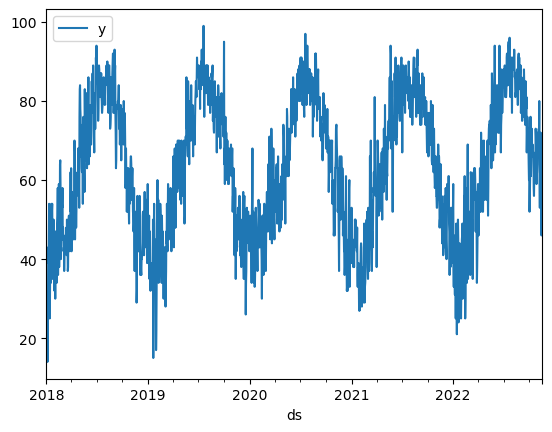

In [67]:
weather["2018-01-01":].plot("ds", "y")

In [48]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

plot_components_plotly(m, predictions)

Temperature is high during summer and low during winter and the pattern repeats over time.    
This is called seasonal pattern.     
      
What prophet does is it separtes out the time series into these different factors like how much does the month impacts the temperature or weekly, day of the week etc. is there a general trend in the temperature separate from those seasonal effects.    
extra_regressors_additiive are the precipitation, snow etc.    
     
It is not certain that the temperature drops on wednesday     

Now, we are going to look at how important each of our columns are to prophets predictions. 

In [51]:
from prophet.utilities import regressor_coefficients

We can run regressor coefficients function on our trained prophet model and it shows each row is basically the impact of a single regressor on our prediction

In [52]:
regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp_x,additive,0.118130,-0.196479,-0.196479,-0.196479
1,snow_x,additive,0.064540,-0.010746,-0.010746,-0.010746
2,snwd_x,additive,0.209635,0.064191,0.064191,0.064191
3,tmax_x,additive,61.758648,0.013297,0.013297,0.013297
4,tmin_x,additive,47.494024,-0.083018,-0.083018,-0.083018
5,prcp_y,additive,0.123378,-0.322279,-0.322279,-0.322279
6,snow_y,additive,0.071347,-0.492270,-0.492270,-0.492270
7,snwd_y,additive,0.217759,-0.201893,-0.201893,-0.201893
8,tmax_y,additive,62.609277,0.280684,0.280684,0.280684
9,tmin_y,additive,48.923130,0.426420,0.426420,0.426420


The first row shows us the impact of the precipitation at JFK on tomorrow's temperature    
If it rained today, the prophet thinks the temperature tomorrow will be lower. it is indicating negative coefficient    
Same thing for snow_x and snowd_x but snowd_x has a slight positive which is interesting.       
      
you can see similar coefficients for these other variables as well so this tells you a little bit about how prophet is making its judgements as well as right now we can look at what's called mean squared error      
     
we are going to match our predicitons index to our test index and then we are going to create a column called "actual" in our predictions that has our actual values from our test set.

In [54]:
predictions.index = test.index
predictions["actual"] = test["y"]

In [55]:
def mse(predictions, actual_label="actual", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label]) **2)
    print(se.mean())

mse(predictions)

40.510991068629096


As a baseline when a machine learning model with manual feature engineering which is basically telling the model which features are important and creating ratios, the mean squared error was about 36 and the deep learning was around 52 so this model is pretty good.      
     
What we are going to do next is we're actually going to evaluate the prophet model across our entire dataset.     
The above is for 2022 but something could be weird about 2022 with temperatures

## Cross Validation

If we evaluate it across our whole data set using something called cross validation we can get more realistic error estimate.     
it splits up data into multiple pieces and then it uses the first piece for example to predict the second piece then it puts the first and second pieces together uses it to predict the third piece and what this makes sure is you're not training your model using the same data you're testing it on but you're still able to get an error metric or estimate across a good portion of your data     
     
we call the fit_prophet and this time pass in the entire weather dataset and then we are going to call cross validation on our prophet instance and we're going to pass in a variable called initial, how many initial days of training data we want before we start making predictions and it is 5 years of data and then we're going to specify a period so a period is how often we want to train a new model, it is 180 days, and then how many days we want to make predictions for which is also 180 days.     
     
So every half year we're going to train a new model and we're going to make predictions.     
Starting from 1975 and every 6 months then onwards.      
     
parallel = "processes" which means we're going to parallelize this method across multiple processes which will make it run a little bit faster. 

In [56]:
from prophet.diagnostics import cross_validation

In [57]:
m = fit_prophet(weather)
cv=cross_validation(m, initial=f'{365 * 5} days', period='180 days', horizon='180 days', parallel="processes")

13:36:30 - cmdstanpy - INFO - Chain [1] start processing
13:36:35 - cmdstanpy - INFO - Chain [1] done processing
13:36:37 - cmdstanpy - INFO - Chain [1] start processing
13:36:37 - cmdstanpy - INFO - Chain [1] start processing
13:36:37 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] done processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] done processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chain [1] start processing
13:36:38 - cmdstanpy - INFO - Chai

13:37:35 - cmdstanpy - INFO - Chain [1] start processing
13:37:38 - cmdstanpy - INFO - Chain [1] done processing
13:37:39 - cmdstanpy - INFO - Chain [1] done processing
13:37:40 - cmdstanpy - INFO - Chain [1] start processing
13:37:41 - cmdstanpy - INFO - Chain [1] done processing
13:37:41 - cmdstanpy - INFO - Chain [1] start processing
13:37:42 - cmdstanpy - INFO - Chain [1] done processing
13:37:43 - cmdstanpy - INFO - Chain [1] start processing
13:37:44 - cmdstanpy - INFO - Chain [1] done processing
13:37:46 - cmdstanpy - INFO - Chain [1] done processing
13:37:46 - cmdstanpy - INFO - Chain [1] start processing
13:37:46 - cmdstanpy - INFO - Chain [1] start processing
13:37:48 - cmdstanpy - INFO - Chain [1] done processing
13:37:48 - cmdstanpy - INFO - Chain [1] start processing
13:37:49 - cmdstanpy - INFO - Chain [1] done processing
13:37:50 - cmdstanpy - INFO - Chain [1] done processing
13:37:50 - cmdstanpy - INFO - Chain [1] start processing
13:37:51 - cmdstanpy - INFO - Chain [1] 

In [58]:
mse(cv, actual_label="y")

36.17490852174736


Our error across our whole dataset is actually little bit lowe than our error for 2022      
      
We can plot the last 365 days     
     
This is our actualy y value and we can we can see our predicted y as well and it is correlate as well.     
     
How ever, there are a lot of spikes in the actual tempature and ti could be a storm system or hurricane etc.     
Our model doesnot have this information

<AxesSubplot:>

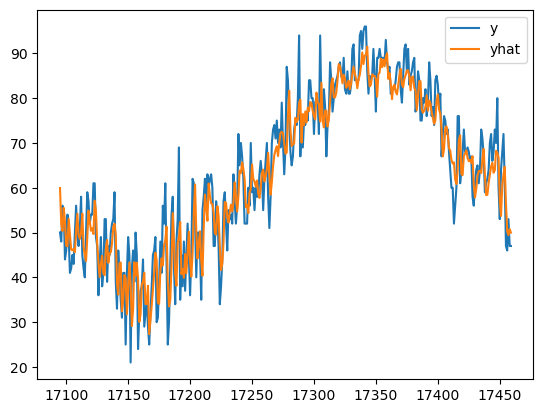

In [60]:
cv[["y", "yhat"]][-365:].plot()

## Make future predictions

We can use this model to predict one day ahead. last day in our data 

In [61]:
m = fit_prophet(weather)
m.predict(weather.iloc[-1:])

13:41:44 - cmdstanpy - INFO - Chain [1] start processing
13:41:49 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-17,61.662203,42.492669,58.167465,61.662203,61.662203,-11.530331,-11.530331,-11.530331,-7.9043,...,-0.065293,-0.065293,-0.065293,-3.560739,-3.560739,-3.560739,0.0,0.0,0.0,50.131871


This is our predicted tempature for Nov 18th . (Actual is about 45)      
      
There is another way to predict that is less acurate gut can predict multiple days ahead

In [62]:
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)

13:47:54 - cmdstanpy - INFO - Chain [1] start processing
13:47:56 - cmdstanpy - INFO - Chain [1] done processing


Initialize Prophet then fit entire weather dataset     
      
then call the make_future_dataframe method to basically create dates for the next 365 days and that dataframe is called future

In [63]:
future

,ds
0,1970-01-01
1,1970-01-02
2,1970-01-03
3,1970-01-04
4,1970-01-05
...,...
19674,2023-11-13
19675,2023-11-14
19676,2023-11-15
19677,2023-11-16


it is for the year 2023     
     
we call m.predict for the future

In [64]:
forecast = m.predict(future)

In [65]:
plot_plotly(m, forecast)